In [1]:
%load_ext autoreload
%autoreload 2

## Import Utility

In [2]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

## Load Dataset

In [3]:
from scripts.repository.repository import Repository

In [4]:
repo = Repository()

In [5]:
X = repo.load_data(
    name='X_contrast_stretching', folder='reference/Contrast_stretching', load_format='npy')


In [6]:
y = repo.load_data(name='y', folder='numpy', load_format='npy')

## Load Best artifact

In [7]:
model = tf.keras.models.load_model('artifacts/cnn_best_artifact.h5')

In [8]:
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

X_test, X_val, y_test, y_val = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

## Model Prediction

In [9]:
from scripts.utils.utility import compare_actual_and_predicted_xray


22/22 [==============================] - 1s 48ms/step


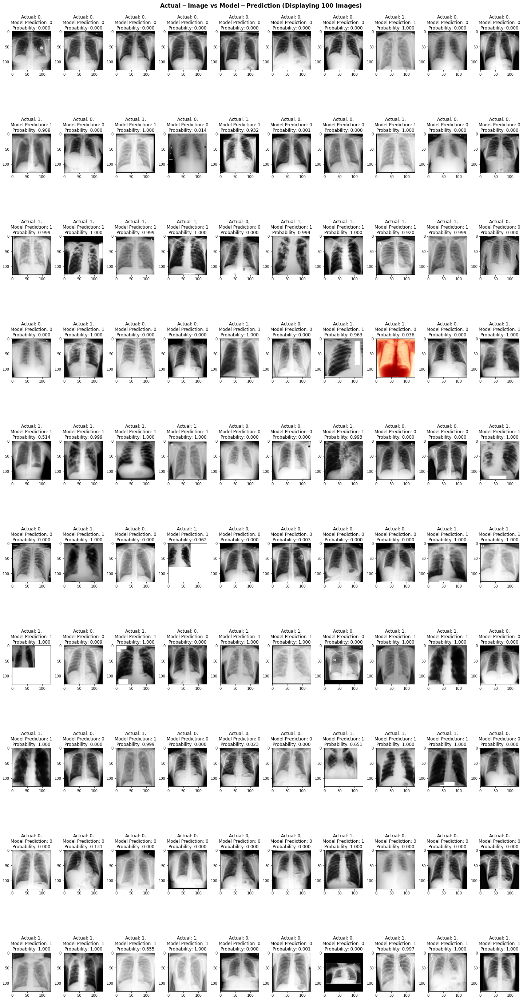

In [10]:
compare_actual_and_predicted_xray(
                estimator=model,
                images=X_test,
                target=y_test, 
                title=None,
                num_display=100,
                num_cols=10, 
                random_mode=True)

# 4. Lung segmentation
**Objective**: adapt this Lung segmentation for LIME
steps:
- Equalize the image with CLAHE
- Create a threshold mask to separate tissue by pixel intensity
- Find regions in the threshold
- Remove borders
- Fill small holes
- Extract lung areas

**Reference**: Lung Segmentation without CNN->https://www.kaggle.com/code/davidbroberts/lung-segmentation-without-cnn/notebook


In [11]:
from scripts.image_processing.segmentation import ImageSegmentation

In [12]:
img_segmetator=ImageSegmentation(input_shape=(128,128))

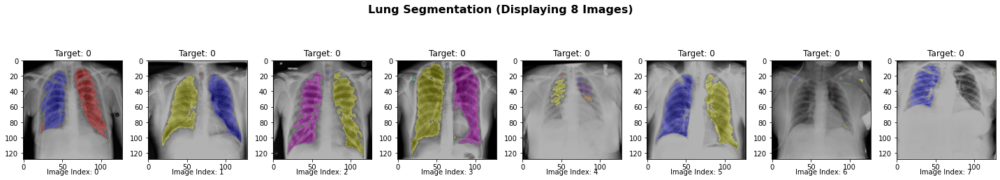

In [13]:
img_segmetator.show_segmented_images(images=X,
                                     target=y,
                                     num_display=8, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

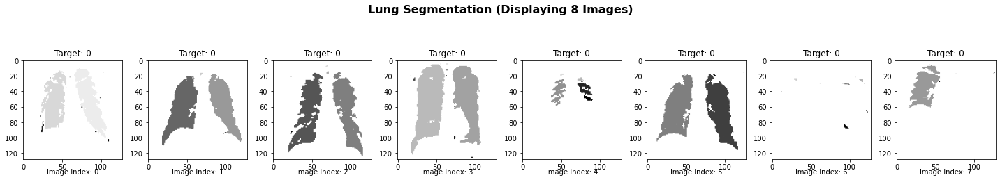

In [14]:
img_segmetator.show_segmented_images(images=X,
                                     target=y,
                                     num_display=8, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=True)

# 5. Explainability

## 5.1 Why Explainability


**Training CNNs** for Tuberculosis Detection using Chest X-ray images, the importance of model explainability cannot be understated. While achieving high accuracy and performance is crucial, understanding why and how the model arrives at its predictions is equally essential.


**Medical image classification tasks**, Explainable models provide transparency by revealing the features or regions of interest in the input images that contribute to the model's decisions.

## 5.2 Explainer
Feature Visualization

Feature visualization techniques, such as Grad-CAM (Gradient-weighted Class Activation Mapping), <u>highlight</u> the regions of an image that **contribute most to the model's decision**. This provides insights into which parts of the X-ray images the model is focusing on when making predictions.


### 5.2.1 Lime Library

**Local Interpretable Model-Agnostic Explanations (LIME)** 

is a library that explains predictions of machine learning models in an interpretable and understandable way. LIME works by training a local surrogate model around each prediction instance to approximate the behavior of the complex model. The surrogate model is then used to explain the prediction's outcome by highlighting the features that contributed the most to the decision.

**LIME**

is short for "Local Interpretable **Model-agnostic Explanations.**" It deals with explaining predictions made by **image-based** models, highlighting which areas of the input image were most influential in the model's decision-making process.

**Use to**

- **Interpretable** Literally translated, LIME is a method for translating the behavior of models that are difficult to understand so that normal people like us can understand them.

- **Model-Agnostic** This means that the LIME method can be used with any model, whether the model is a model that can read its behavior (such as linear regression, decision trees) or the model is so complex that we don't know its inner behavior (such as a neural network. ), which means we can view the model we use as a black-box.

- used to **explain why** a specific image was classified as it was by identifying the segmented areas (features) that had the most impact on the model's prediction.
- To **visualize** and **understand** Model's predictions


**Function:**
1. **lime.explain_instance()**
    - **Objective:** Generates explanations for a prediction by perturbing features.
    - **Parameters:**
        - **image** - A 3-dimensional RGB image. If it's two-dimensional, it's assumed to be a grayscale image.
        - **classifier_fn** - Classifier prediction probability function that outputs prediction probabilities. For ScikitClassifiers, this is `classifier.predict_proba`.
        - **labels** - Iterable with labels to be explained. 
        - **hide_color** - TODO
        - **top_labels** - If not None, explanations are generated for the K labels with highest prediction probabilities.
        - **num_features** - Maximum number of features present in explanation.
        - **num_samples** - Size of the neighborhood to learn the linear model.
        - **batch_size** - TODO
        - **distance_metric** - The distance metric to use for weights.
        - **model_regressor** - Sklearn regressor used in explanation. Defaults to Ridge regression in LimeBase.
        - **segmentation_fn** - SegmentationAlgorithm, wrapped skimage function.
        - **random_seed** - Integer used as random seed for the segmentation algorithm.
        - **progress_bar** - If True, show tqdm progress bar.
    - **Returns:** An ImageExplanation object with corresponding explanations.

    **Explanation:** The **explain_instance** function generates neighborhood data by **perturbing features** from the instance. It then **learns locally weighted linear models** on this neighborhood data to explain each of the classes in an interpretable way.

2. **lime.get_image_and_mask()**
    - **Objective:** Generates an explanation of the areas of an image that are most influential in a model's prediction.
    - **Parameters:**
        - **label** - Label to explain. focus on explaining why the model predicted that particular class
            - For example, if you have a binary classification problem with two classes, "Cat" and "Dog," and you want to generate an explanation for the "Cat" class, you would set the label parameter to the value associated with the "Cat" class.
        - **positive_only** - If True, only takes superpixels that positively contribute to the label's prediction.
        - **negative_only** - If True, only takes superpixels that negatively contribute to the label's prediction.
        - **hide_rest** - If True, makes the non-explanation part of the return image gray.
        - **num_features** - Number of superpixels to include in explanation.
        - **min_weight** - Minimum weight of the superpixels to include in explanation.
    - **Returns:** `(image, mask)`, where image is a 3D numpy array and mask is a 2D numpy array that can be used with skimage.segmentation.mark_boundaries.

**Read more:** 
- Community: https://notebook.community/marcotcr/lime/doc/notebooks/Tutorial%20-%20Image%20Classification%20Keras
- Document: https://lime-ml.readthedocs.io/en/latest/lime.html
- How to Use LIME to Interpret Predictions of ML Models?: https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions

In [97]:
from scripts.explainabillity.image_explainer import Explainer

In [16]:
explnr = Explainer(estimator=model, input_shape=(128, 128))

- **top_labels** is Hiehest probabilities, which number of labels or classes 
    - Binary classification problem (Tuberculosis vs. Normal), setting "top_labels" to 1 means you are interested in explaining predictions for the positive class (Tuberculosis) or the negative class (Normal)

- **num_samples** is the number of randomly generated perturbed samples used to build the local surrogate model for explanation.
    - controls how many different variations of the input image are considered when approximating the model's decision boundary. A larger "num_samples" value can provide more robust explanations but may require more computational resources.
    
- **num_features** he number of highlighted features or segmented areas, means LIME will identify and display the top 5 such regions or features, making it easier for you to understand which parts of the image were most influential in predicting the presence or absence of Tuberculosis.

What is the green and red highlighted area in lime explanations?

1. Green Highlighted Area: The green highlighted area typically represents the regions of the input data that have a **positive class** influence on the model's prediction.
    - **positive** refers to the presence of Tuberculosis. 

2. Red Highlighted Area: Conversely, the red highlighted area represents regions of the input data that have a **negative class** influence on the model's prediction. 
    - **negative** refers to the presence of Normal. 


> Note: The green area is the area that the model uses to classify whether it is Disease or not.

#### Available image from **skimage.segmentation**
Included:
- felzenszwalb
- slic
- quickshift
- watershed

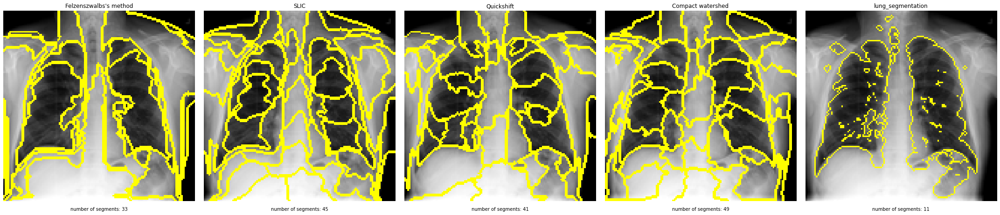

In [17]:
explnr.diff_sementation(X=X_test)

- Image-Explanation:
    - Green area: used to classify as Positive class
    - Red area: used to classify as Negative class

### lung_segmentation

  0%|          | 0/1000 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


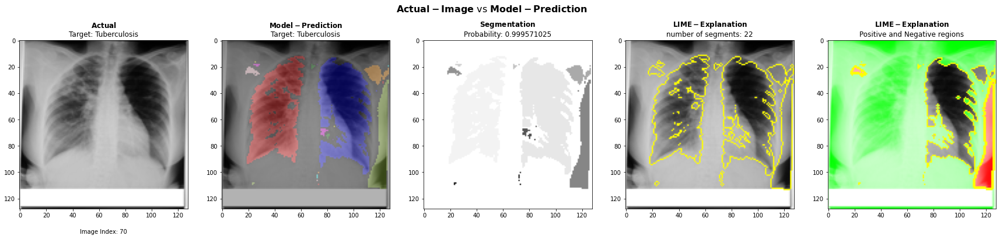

  0%|          | 0/1000 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


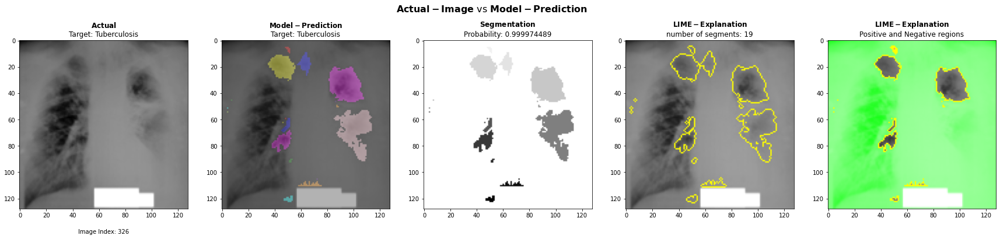

In [95]:
explnr.lime(X=X_test,
            y=y_test,
            top_labels=1,
            num_samples=1000,
            num_features=5,
            class_names=['Normal', 'Tuberculosis'],
            num_display=2,
            method='lung_segmentation',
            random_mode=True,
            cmap='gray'
            )


### slic

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


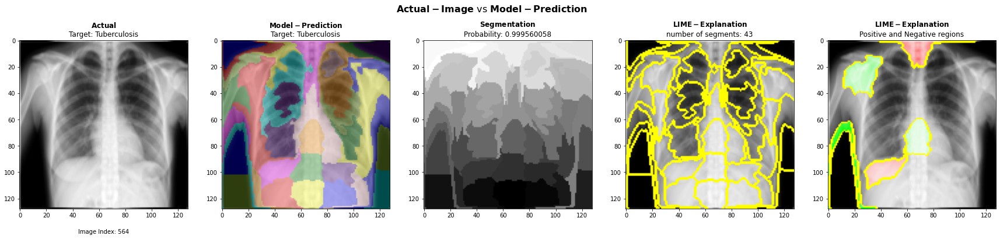

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


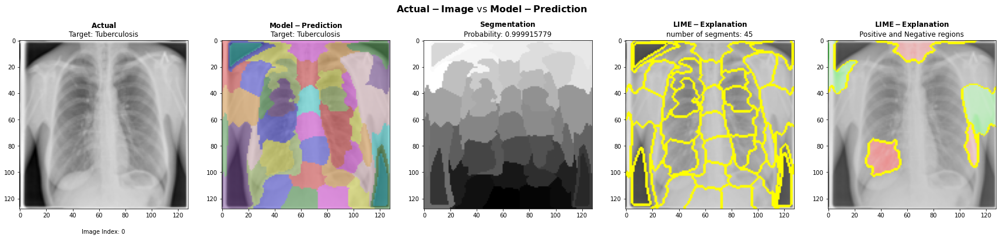

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


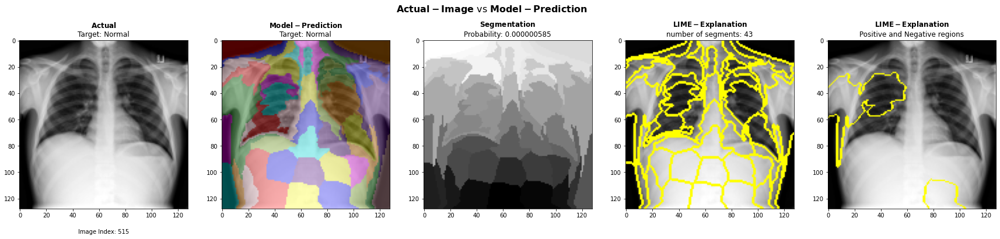

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


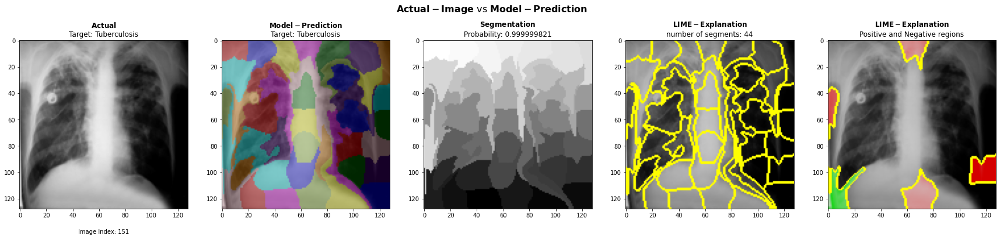

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


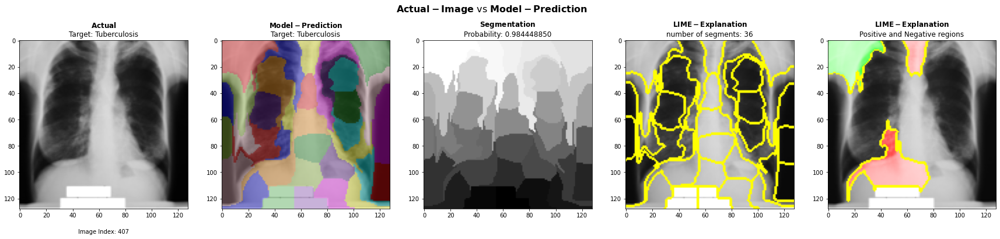

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


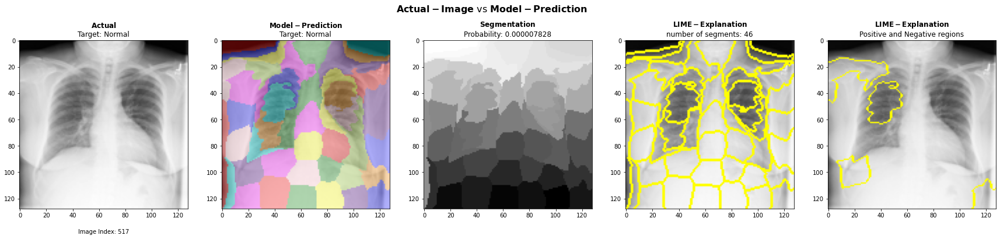

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


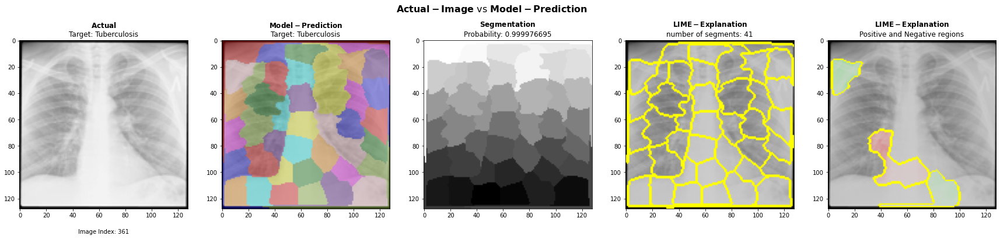

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


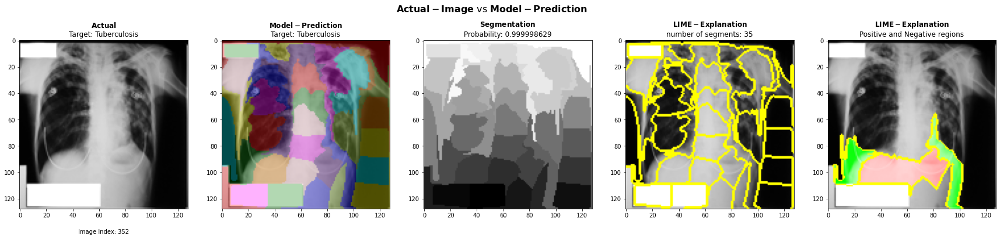

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


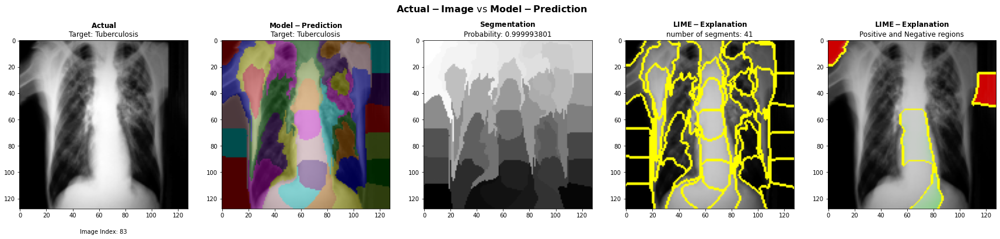

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


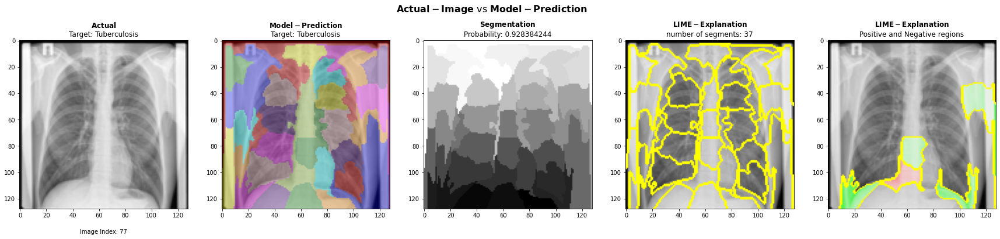

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


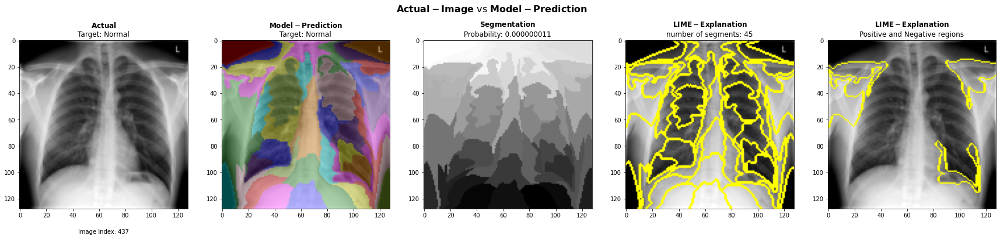

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


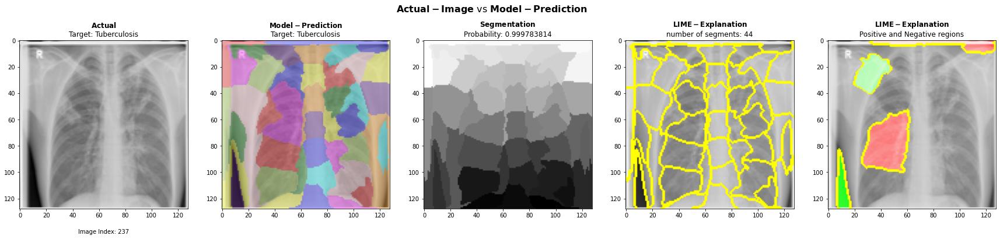

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


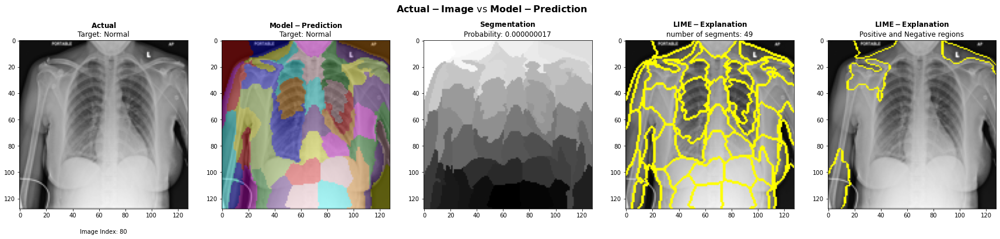

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


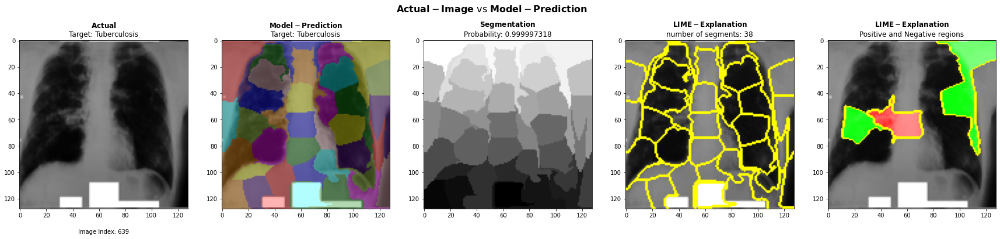

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


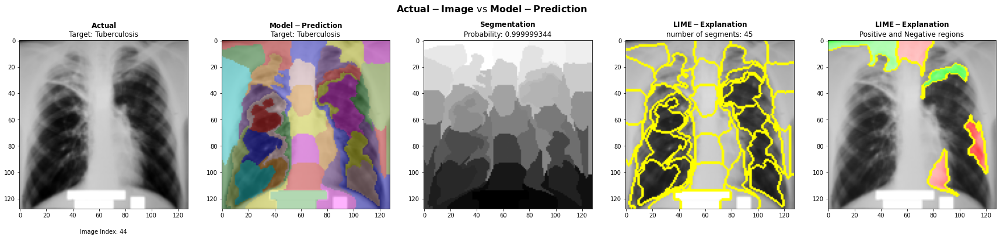

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


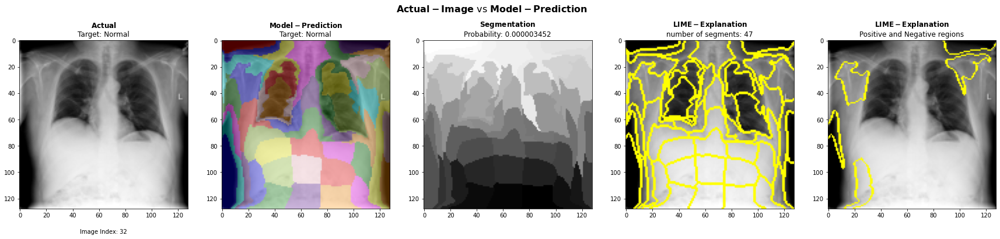

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


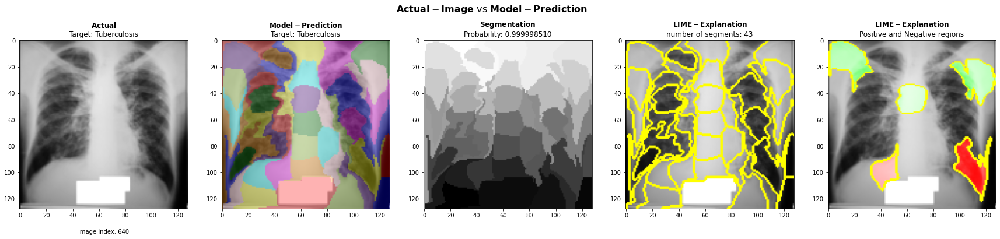

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


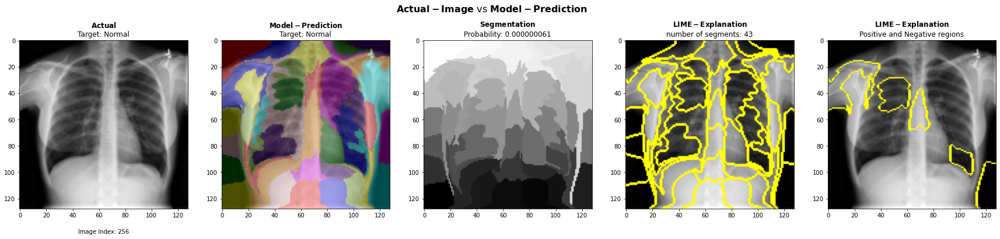

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


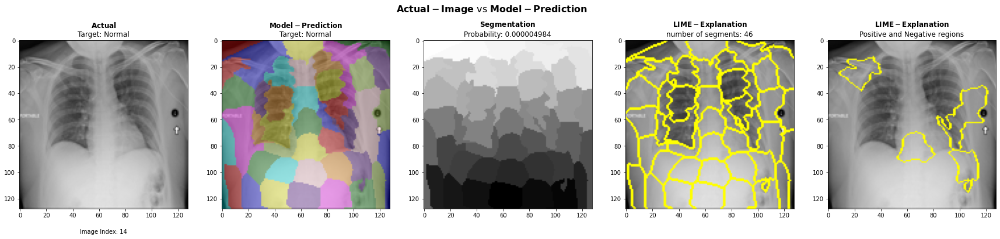

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


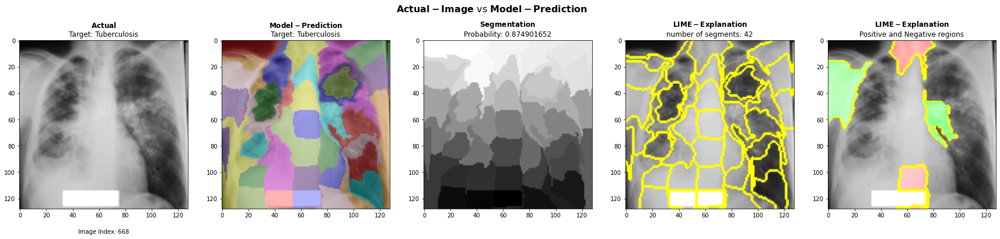

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


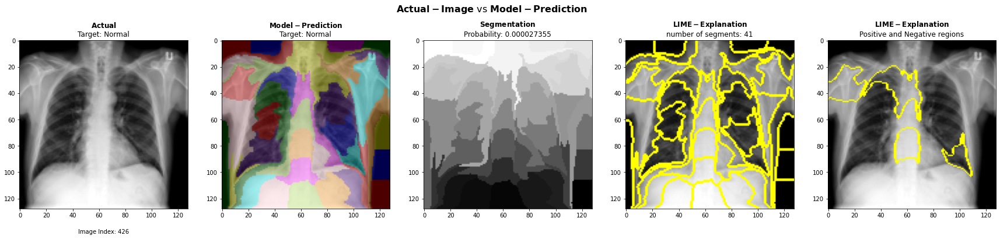

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


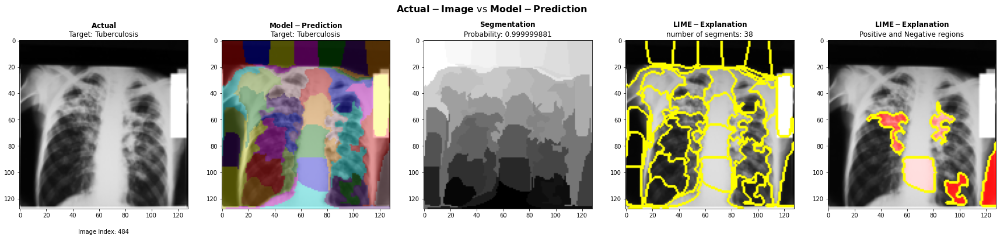

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


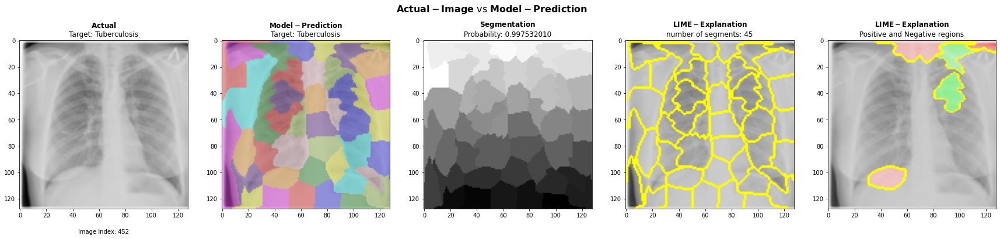

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


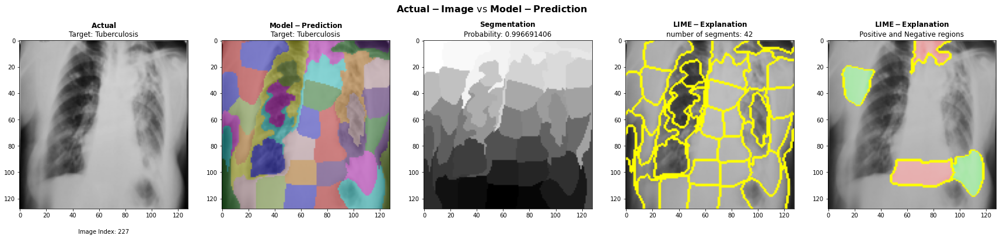

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


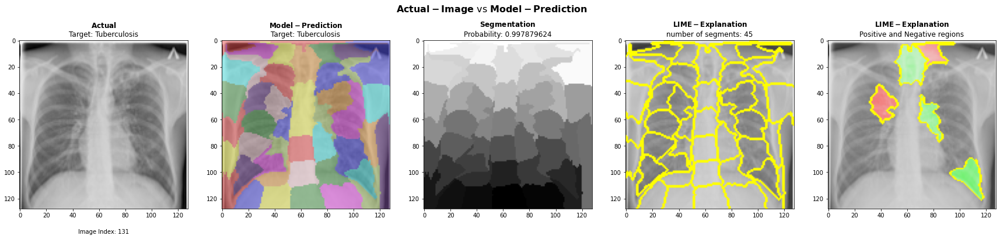

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


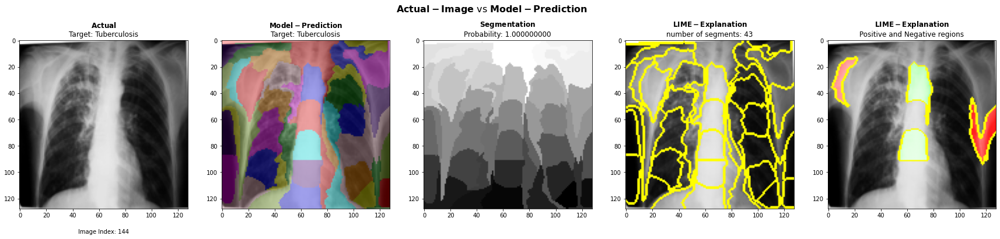

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


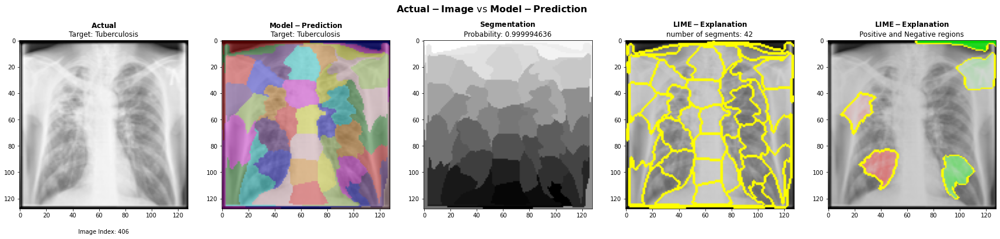

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


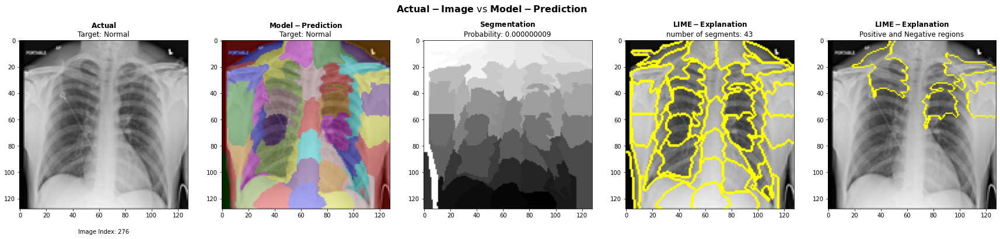

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


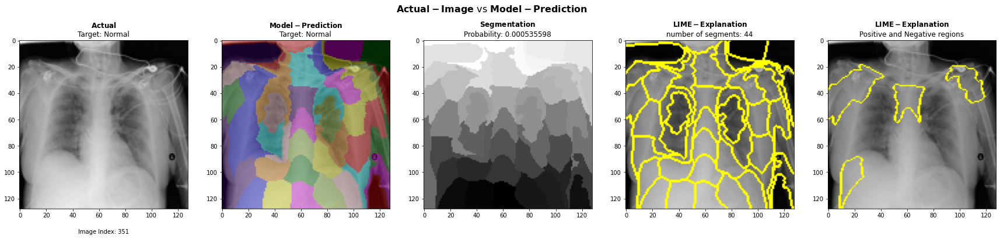

  0%|          | 0/100 [00:00<?, ?it/s]

d:\Repo\DS\Classification\BinaryClassification\Tuberculosis\scripts\explainabillity\image_explainer.py:182: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fontsize=10, ha='center')


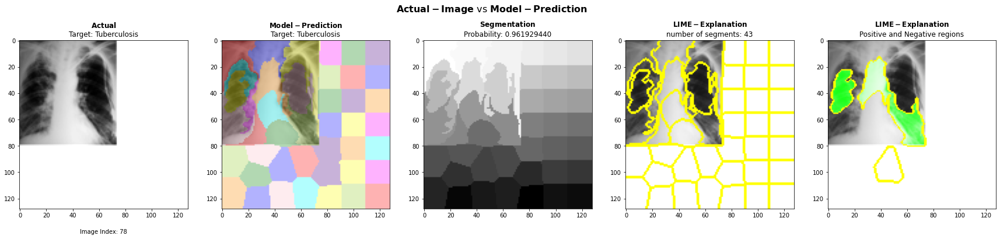

In [96]:
explnr.lime(X=X_test,
            y=y_test,
            top_labels=1,
            num_samples=100,
            num_features=5,
            class_names=['Normal', 'Tuberculosis'],
            num_display=30,
            method='slic',
            random_mode=True,
            cmap='gray')